<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#A-quick-PyCaret-tutorial" data-toc-modified-id="A-quick-PyCaret-tutorial-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>A quick PyCaret tutorial</a></span></li><li><span><a href="#Getting-data" data-toc-modified-id="Getting-data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Getting data</a></span></li><li><span><a href="#Inspect-the-data" data-toc-modified-id="Inspect-the-data-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Inspect the data</a></span></li><li><span><a href="#Explore-the-data" data-toc-modified-id="Explore-the-data-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Explore the data</a></span></li><li><span><a href="#Prepare-the-data" data-toc-modified-id="Prepare-the-data-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Prepare the data</a></span></li><li><span><a href="#Train-some-baseline-models" data-toc-modified-id="Train-some-baseline-models-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Train some baseline models</a></span></li><li><span><a href="#Hyperparameter-tuning" data-toc-modified-id="Hyperparameter-tuning-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Hyperparameter tuning</a></span></li><li><span><a href="#Ensembling" data-toc-modified-id="Ensembling-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Ensembling</a></span></li><li><span><a href="#Evaluate-the-results" data-toc-modified-id="Evaluate-the-results-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Evaluate the results</a></span><ul class="toc-item"><li><span><a href="#Confusion-matrix" data-toc-modified-id="Confusion-matrix-9.1"><span class="toc-item-num">9.1&nbsp;&nbsp;</span>Confusion matrix</a></span></li><li><span><a href="#Errors" data-toc-modified-id="Errors-9.2"><span class="toc-item-num">9.2&nbsp;&nbsp;</span>Errors</a></span></li><li><span><a href="#Precision-versus-recall" data-toc-modified-id="Precision-versus-recall-9.3"><span class="toc-item-num">9.3&nbsp;&nbsp;</span>Precision versus recall</a></span></li><li><span><a href="#Feature-importance" data-toc-modified-id="Feature-importance-9.4"><span class="toc-item-num">9.4&nbsp;&nbsp;</span>Feature importance</a></span><ul class="toc-item"><li><span><a href="#Model-interpretation" data-toc-modified-id="Model-interpretation-9.4.1"><span class="toc-item-num">9.4.1&nbsp;&nbsp;</span>Model interpretation</a></span></li></ul></li></ul></li><li><span><a href="#Use-the-model-on-new-data" data-toc-modified-id="Use-the-model-on-new-data-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>Use the model on new data</a></span></li><li><span><a href="#Export-the-pipeline" data-toc-modified-id="Export-the-pipeline-11"><span class="toc-item-num">11&nbsp;&nbsp;</span>Export the pipeline</a></span></li><li><span><a href="#Deploy" data-toc-modified-id="Deploy-12"><span class="toc-item-num">12&nbsp;&nbsp;</span>Deploy</a></span><ul class="toc-item"><li><span><a href="#Make-a-simple-&quot;proof-of-concept&quot;-application-using-Gradio" data-toc-modified-id="Make-a-simple-&quot;proof-of-concept&quot;-application-using-Gradio-12.1"><span class="toc-item-num">12.1&nbsp;&nbsp;</span>Make a simple "proof of concept" application using Gradio</a></span></li></ul></li></ul></div>

> **NB**: If you want to run this notebook on your own computer, you should install our PyCaret environment specified in `environment-pycaret.yml`. That is, run `conda env update -f environment-pycaret.yml`.

# A quick PyCaret tutorial

<a href="https://pycaret.readthedocs.io/en/latest/index.html"><img src="https://github.com/alu042/DAT158-2022/raw/main/notebooks/assets/pycaret.png" width="800" height="400"></a>

<img src="https://github.com/alu042/DAT158-2022/raw/main/notebooks/assets/pycaret2.png">

> This will be a concise tutorial on PyCaret. Consult the documentation at https://pycaret.gitbook.io/docs/ for more. 

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
# This is a quick check of whether the notebook is currently running on Google Colaboratory
# or on Kaggle, as that makes some difference for the code below.
# We'll do this in every notebook of the course.
try:
    import colab
    colab=True
except:
    colab=False

import os
kaggle = os.environ.get('KAGGLE_KERNEL_RUN_TYPE', '')

In [3]:
if (colab or kaggle):
    %pip install pycaret[all]

In [4]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Getting data

PyCaret comes with functionality for loading many standard benchmark datasets:

In [5]:
import pycaret

In [6]:
from pycaret.datasets import get_data

In [7]:
_ = get_data('index')

,Dataset,Data Types,Default Task,Target Variable 1,Target Variable 2,# Instances,# Attributes,Missing Values
0,anomaly,Multivariate,Anomaly Detection,None,None,1000,10,N
1,france,Multivariate,Association Rule Mining,InvoiceNo,Description,8557,8,N
2,germany,Multivariate,Association Rule Mining,InvoiceNo,Description,9495,8,N
3,bank,Multivariate,Classification (Binary),deposit,None,45211,17,N
4,blood,Multivariate,Classification (Binary),Class,None,748,5,N
5,cancer,Multivariate,Classification (Binary),Class,None,683,10,N
6,credit,Multivariate,Classification (Binary),default,None,24000,24,N
7,diabetes,Multivariate,Classification (Binary),Class variable,None,768,9,N
8,electrical_grid,Multivariate,Classification (Binary),stabf,None,10000,14,N
9,employee,Multivariate,Classification (Binary),left,None,14999,10,N


# Inspect the data

We'll use one of the smaller data sets to reduce computational time.  But, of course, you're welcome to try some of the other data sets listed above!

In [8]:
#data = get_data('income')
data = get_data('diabetes')

,Number of times pregnant,Plasma glucose concentration a 2 hours in an oral glucose tolerance test,Diastolic blood pressure (mm Hg),Triceps skin fold thickness (mm),2-Hour serum insulin (mu U/ml),Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years),Class variable
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [9]:
data['Class variable'].value_counts()

0    500
1    268
Name: Class variable, dtype: int64

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                                                                    Non-Null Count  Dtype  
---  ------                                                                    --------------  -----  
 0   Number of times pregnant                                                  768 non-null    int64  
 1   Plasma glucose concentration a 2 hours in an oral glucose tolerance test  768 non-null    int64  
 2   Diastolic blood pressure (mm Hg)                                          768 non-null    int64  
 3   Triceps skin fold thickness (mm)                                          768 non-null    int64  
 4   2-Hour serum insulin (mu U/ml)                                            768 non-null    int64  
 5   Body mass index (weight in kg/(height in m)^2)                            768 non-null    float64
 6   Diabetes pedigree function                                         

In [11]:
data.describe()

,Number of times pregnant,Plasma glucose concentration a 2 hours in an oral glucose tolerance test,Diastolic blood pressure (mm Hg),Triceps skin fold thickness (mm),2-Hour serum insulin (mu U/ml),Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years),Class variable
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


The target is `Class variable`, which is binary (True / False):

<AxesSubplot:>

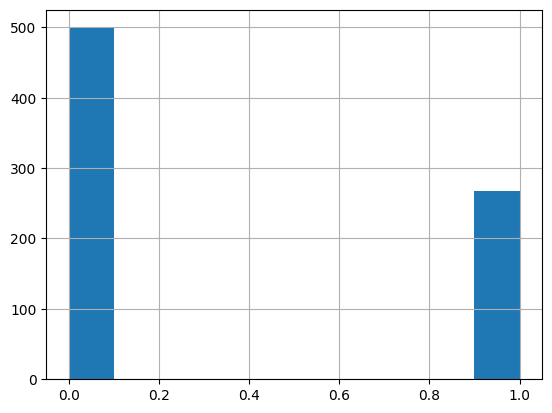

In [12]:
data['Class variable'].hist()

We observe that:
- There are both numerical and categorical features
- We need to scale the numerical features if we plan to use methods that need features on similar scales
- The dataset is imbalanced

# Explore the data

After downloading data and looking at its structure, one should start a more thorough exploration. We've seen how this can be done earlier in the course.

Here's a convenient package that can perform some of the common exploration steps automatically:

In [13]:
from pandas_profiling import ProfileReport

In [14]:
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Prepare the data

In [15]:
from pycaret.classification import *

In [16]:
experiment = setup(data=data, target='Class variable', numeric_imputation='median', 
             normalize=True, normalize_method='robust', session_id=42)

,Description,Value
0,session_id,42
1,Target,Class variable
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(768, 9)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


# Train some baseline models

In [17]:
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


In [18]:
top_models = compare_models(n_select=6, sort='F1')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ada,Ada Boost Classifier,0.7597,0.8199,0.6061,0.6741,0.6360,0.4580,0.4609,0.0110
lightgbm,Light Gradient Boosting Machine,0.7560,0.8221,0.6173,0.6660,0.6339,0.4532,0.4585,0.0110
gbc,Gradient Boosting Classifier,0.7541,0.8393,0.6225,0.6566,0.6332,0.4502,0.4544,0.0140
catboost,CatBoost Classifier,0.7540,0.8429,0.5906,0.6693,0.6250,0.4439,0.4474,0.1860
rf,Random Forest Classifier,0.7672,0.8397,0.5696,0.7058,0.6239,0.4611,0.4693,0.0260
xgboost,Extreme Gradient Boosting,0.7394,0.8107,0.6070,0.6382,0.6159,0.4205,0.4254,0.0190
et,Extra Trees Classifier,0.7579,0.8140,0.5538,0.6951,0.6100,0.4399,0.4490,0.0240
lr,Logistic Regression,0.7503,0.8275,0.5588,0.6734,0.6080,0.4282,0.4335,0.0940
ridge,Ridge Classifier,0.7503,0.0000,0.5485,0.6777,0.6020,0.4250,0.4318,0.0030
lda,Linear Discriminant Analysis,0.7485,0.8239,0.5485,0.6779,0.6006,0.4220,0.4296,0.0030


# Hyperparameter tuning

Now we've found some candidate models: 

In [19]:
top_models

[AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                    n_estimators=50, random_state=42),
 LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
                importance_type='split', learning_rate=0.1, max_depth=-1,
                min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
                n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
                random_state=42, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
                subsample=1.0, subsample_for_bin=200000, subsample_freq=0),
 GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                            learning_rate=0.1, loss='deviance', max_depth=3,
                            max_features=None, max_leaf_nodes=None,
                            min_impurity_decrease=0.0, min_impurity_split=None,
                            min_samples_leaf=1, min_samples_split=2,
                        

We'll want to tune their hyperparameters to try to improve their performance. (Note that yo may consider skipping catboost as it takes a long time to train):

In [23]:
tune_catboost = False

In [20]:
%%time
tuned_ada = tune_model(top_models[0], fold=10, n_iter=100, optimize='F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8148,0.9113,0.6842,0.7647,0.7222,0.5840,0.5860
1,0.8519,0.8917,0.6842,0.8667,0.7647,0.6588,0.6686
2,0.7778,0.8571,0.5789,0.7333,0.6471,0.4882,0.4954
3,0.6852,0.7571,0.3684,0.5833,0.4516,0.2463,0.2591
4,0.7222,0.8586,0.5789,0.6111,0.5946,0.3836,0.3839
5,0.8889,0.9173,0.7895,0.8824,0.8333,0.7504,0.7530
6,0.7593,0.8211,0.4211,0.8000,0.5517,0.4081,0.4474
7,0.6792,0.8183,0.4444,0.5333,0.4848,0.2548,0.2570
8,0.8113,0.8802,0.6111,0.7857,0.6875,0.5554,0.5644


In [21]:
%%time
tuned_lightgbm = tune_model(top_models[1], fold=10, n_iter=400, optimize='F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8333,0.9203,0.7368,0.7778,0.7568,0.6301,0.6307
1,0.7593,0.8707,0.4737,0.7500,0.5806,0.4236,0.4456
2,0.7778,0.8466,0.7368,0.6667,0.7000,0.5242,0.5259
3,0.7222,0.7820,0.5263,0.6250,0.5714,0.3682,0.3711
4,0.7593,0.8647,0.6842,0.6500,0.6667,0.4785,0.4788
5,0.8519,0.8962,0.7895,0.7895,0.7895,0.6752,0.6752
6,0.7407,0.7519,0.5263,0.6667,0.5882,0.4028,0.4088
7,0.7358,0.8302,0.6667,0.6000,0.6316,0.4266,0.4280
8,0.7925,0.8619,0.6667,0.7059,0.6857,0.5310,0.5315


CPU times: user 4.72 s, sys: 829 ms, total: 5.55 s
Wall time: 8.82 s


In [22]:
%%time
tuned_gbc = tune_model(top_models[2], fold=10, n_iter=100, optimize='F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7963,0.8632,0.7368,0.7000,0.7179,0.5587,0.5591
1,0.7963,0.8692,0.5789,0.7857,0.6667,0.5248,0.5375
2,0.8148,0.8481,0.8421,0.6957,0.7619,0.6126,0.6201
3,0.7037,0.7534,0.5263,0.5882,0.5556,0.3344,0.3355
4,0.7778,0.8331,0.7368,0.6667,0.7000,0.5242,0.5259
5,0.8519,0.8782,0.8421,0.7619,0.8000,0.6828,0.6850
6,0.6667,0.7143,0.4737,0.5294,0.5000,0.2512,0.2520
7,0.7547,0.8317,0.6667,0.6316,0.6486,0.4605,0.4609
8,0.7547,0.8349,0.7778,0.6087,0.6829,0.4877,0.4975


CPU times: user 1.39 s, sys: 63.1 ms, total: 1.45 s
Wall time: 11.6 s


In [24]:
%%time
if tune_catboost:
    tuned_catboost = tune_model(top_models[3], fold=10, n_iter=200, optimize='F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8148,0.8391,0.7368,0.7368,0.7368,0.5940,0.5940
1,0.7222,0.8195,0.5263,0.6250,0.5714,0.3682,0.3711
2,0.8333,0.8872,0.7368,0.7778,0.7568,0.6301,0.6307
3,0.7222,0.7519,0.5789,0.6111,0.5946,0.3836,0.3839
4,0.7778,0.8617,0.6842,0.6842,0.6842,0.5128,0.5128
5,0.8333,0.9023,0.8421,0.7273,0.7805,0.6473,0.6518
6,0.7222,0.7654,0.4211,0.6667,0.5161,0.3350,0.3524
7,0.7736,0.8127,0.6667,0.6667,0.6667,0.4952,0.4952
8,0.7170,0.8651,0.6667,0.5714,0.6154,0.3936,0.3965


CPU times: user 2.96 s, sys: 567 ms, total: 3.52 s
Wall time: 2min 37s


In [25]:
%%time
tuned_rf = tune_model(top_models[4], fold=10, n_iter=300, optimize='F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7407,0.8338,0.8421,0.5926,0.6957,0.4815,0.5041
1,0.7963,0.8406,0.8421,0.6667,0.7442,0.5787,0.5896
2,0.7778,0.8662,0.8947,0.6296,0.7391,0.5556,0.5817
3,0.6852,0.7556,0.8421,0.5333,0.6531,0.3904,0.4249
4,0.8148,0.8556,0.9474,0.6667,0.7826,0.6296,0.6592
5,0.7778,0.9008,0.8947,0.6296,0.7391,0.5556,0.5817
6,0.6852,0.7767,0.7368,0.5385,0.6222,0.3634,0.3766
7,0.6415,0.7500,0.7778,0.4828,0.5957,0.3041,0.3322
8,0.7170,0.8333,0.8889,0.5517,0.6809,0.4506,0.4923


CPU times: user 3.57 s, sys: 439 ms, total: 4.01 s
Wall time: 1min 32s


In [26]:
%%time
tuned_xgboost = tune_model(top_models[5], fold=10, n_iter=300, optimize='F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8333,0.9241,0.9474,0.6923,0.8000,0.6630,0.6870
1,0.8704,0.9173,0.8421,0.8000,0.8205,0.7192,0.7197
2,0.7037,0.8519,0.7895,0.5556,0.6522,0.4074,0.4266
3,0.6481,0.7226,0.6842,0.5000,0.5778,0.2885,0.2989
4,0.8148,0.8865,0.8947,0.6800,0.7727,0.6213,0.6380
5,0.8148,0.9158,0.8947,0.6800,0.7727,0.6213,0.6380
6,0.7222,0.7917,0.6842,0.5909,0.6341,0.4122,0.4151
7,0.7925,0.8563,0.8889,0.6400,0.7442,0.5772,0.5993
8,0.7736,0.8405,0.8333,0.6250,0.7143,0.5330,0.5482


CPU times: user 7.72 s, sys: 735 ms, total: 8.45 s
Wall time: 34.4 s


> **Note:** we've used the default parameter grids set by PyCaret. However, it's often a good idea to do a more careful investigation into what parameters to consider (as it depends not only on the model but also on the data).

We score these updated models:

In [28]:
if tune_catboost:
    compare_models(include=[tuned_ada, tuned_lightgbm, tuned_gbc, tuned_catboost, 
                            tuned_rf, tuned_xgboost], 
               sort='F1')
else:
    compare_models(include=[tuned_ada, tuned_lightgbm, tuned_gbc, 
                            tuned_rf, tuned_xgboost], 
               sort='F1')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
5,Extreme Gradient Boosting,0.7709,0.8563,0.8301,0.6356,0.7184,0.5318,0.5468,0.0120
4,Random Forest Classifier,0.7466,0.8300,0.8614,0.5984,0.7053,0.4968,0.5225,0.0680
2,Gradient Boosting Classifier,0.7709,0.8220,0.6760,0.6754,0.6700,0.4958,0.5007,0.0210
1,Light Gradient Boosting Machine,0.7784,0.8440,0.6439,0.7031,0.6676,0.5030,0.5074,0.0110
3,CatBoost Classifier,0.7671,0.8253,0.6596,0.6703,0.6605,0.4844,0.4877,0.0200
0,Ada Boost Classifier,0.7783,0.8547,0.5792,0.7311,0.6423,0.4862,0.4952,0.2230


These scores can be compared to those obtained when we used default parameters. Note that `tune_model` uses `RandomizedSearchCV` from scikit-learn as its default search strategy. It's, therefore, not guaranteed that you will find the best hyperparameter combination from the parameter grid during the search.

# Ensembling

As we've seen, it's often possible to combine models in a way that outperforms each of the single models. Again, there are multiple ways of doing this. A simple way, as you know, is to use "voting ensembles." In PyCaret, we can use `blend_models` to construct voting ensembles. 

Let's try ensembling the three best models after tuning:

In [31]:
best_models = [tuned_xgboost, tuned_rf, tuned_gbc]

In [32]:
voting_soft = blend_models(best_models, method='soft', optimize='F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7963,0.8857,0.7895,0.6818,0.7317,0.5689,0.5729
1,0.8148,0.8647,0.6316,0.8000,0.7059,0.5735,0.5820
2,0.8333,0.8812,0.8421,0.7273,0.7805,0.6473,0.6518
3,0.6481,0.7729,0.5263,0.5000,0.5128,0.2377,0.2379
4,0.7963,0.8767,0.7895,0.6818,0.7317,0.5689,0.5729
5,0.8148,0.9053,0.7895,0.7143,0.7500,0.6035,0.6054
6,0.6852,0.7474,0.5263,0.5556,0.5405,0.3014,0.3016
7,0.7170,0.8143,0.6667,0.5714,0.6154,0.3936,0.3965
8,0.7358,0.8381,0.7222,0.5909,0.6500,0.4413,0.4470


In [33]:
voting_hard = blend_models(best_models, method='hard', optimize='F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8333,0.0000,0.9474,0.6923,0.8000,0.6630,0.6870
1,0.8889,0.0000,0.8421,0.8421,0.8421,0.7564,0.7564
2,0.7778,0.0000,0.9474,0.6207,0.7500,0.5651,0.6063
3,0.6481,0.0000,0.6842,0.5000,0.5778,0.2885,0.2989
4,0.8333,0.0000,0.9474,0.6923,0.8000,0.6630,0.6870
5,0.7963,0.0000,0.8421,0.6667,0.7442,0.5787,0.5896
6,0.7222,0.0000,0.6842,0.5909,0.6341,0.4122,0.4151
7,0.7547,0.0000,0.8333,0.6000,0.6977,0.5004,0.5195
8,0.7547,0.0000,0.8333,0.6000,0.6977,0.5004,0.5195


As we've seen earlier, one can also train a so-called "blender" on top of the predictions from a set of models and, in that way, make use of more complicated patterns than in a voting ensemble:

In [34]:
blender = stack_models(estimator_list=best_models, optimize='F1')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8148,0.8917,0.6842,0.7647,0.7222,0.5840,0.5860
1,0.8704,0.8767,0.6842,0.9286,0.7879,0.6976,0.7145
2,0.8148,0.8346,0.6316,0.8000,0.7059,0.5735,0.5820
3,0.7222,0.7609,0.4737,0.6429,0.5455,0.3520,0.3605
4,0.6667,0.8000,0.4737,0.5294,0.5000,0.2512,0.2520
5,0.8519,0.9383,0.7368,0.8235,0.7778,0.6672,0.6695
6,0.7222,0.7910,0.3684,0.7000,0.4828,0.3170,0.3476
7,0.7358,0.8063,0.6111,0.6111,0.6111,0.4111,0.4111
8,0.7925,0.8540,0.6667,0.7059,0.6857,0.5310,0.5315


In this case, only the hard voting ensemble outperformed the best single model.

# Evaluate the results

In [35]:
%matplotlib inline

In [36]:
model = voting_hard
model

VotingClassifier(estimators=[('xgboost',
                              XGBClassifier(base_score=0.5, booster='gbtree',
                                            callbacks=None, colsample_bylevel=1,
                                            colsample_bynode=1,
                                            colsample_bytree=0.7,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=0,
                                            gpu_id=-1, grow_policy='depthwise',
                                            importance_type=None,
                                            interaction_constraints='',
                                            learning_ra...
                                                         min_impurity_decrease=0.001,
                              

## Confusion matrix

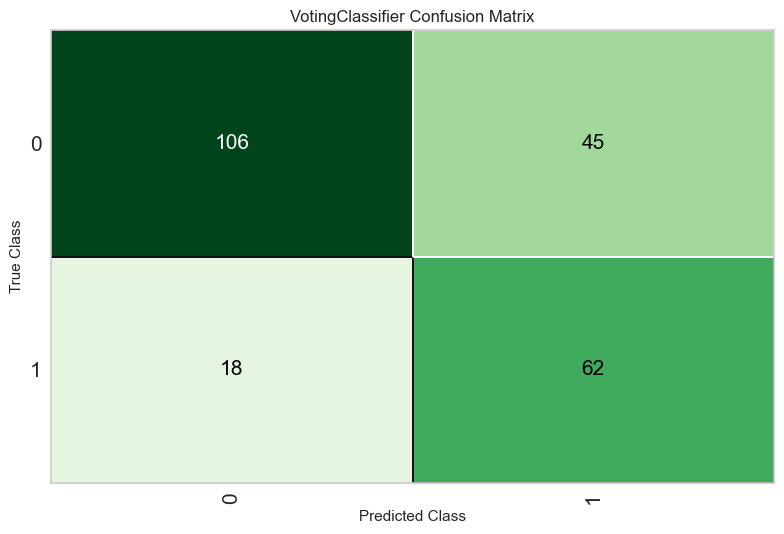

In [37]:
plot_model(model, 'confusion_matrix')

## Errors

Here's a plot of the errors made by the model:

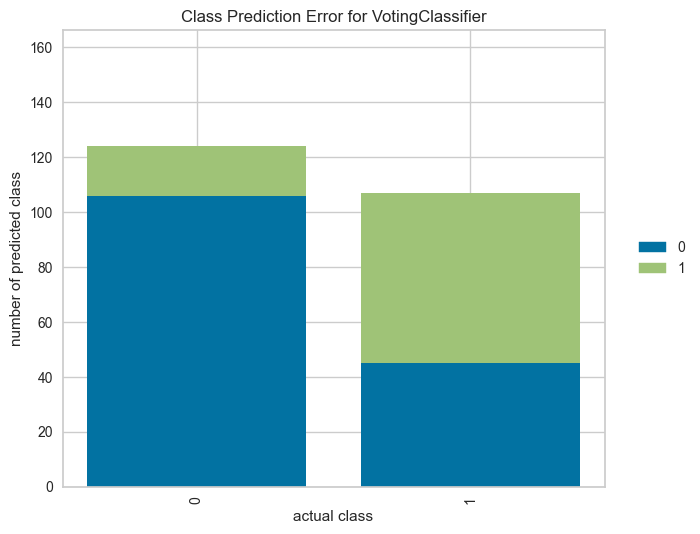

In [38]:
plot_model(model, 'error')

## Precision versus recall

We remember the so-called "bias-variance-tradeoff" and that there is typically a tradeoff between precision and recall. We can visualize where our models have set the thresholds:

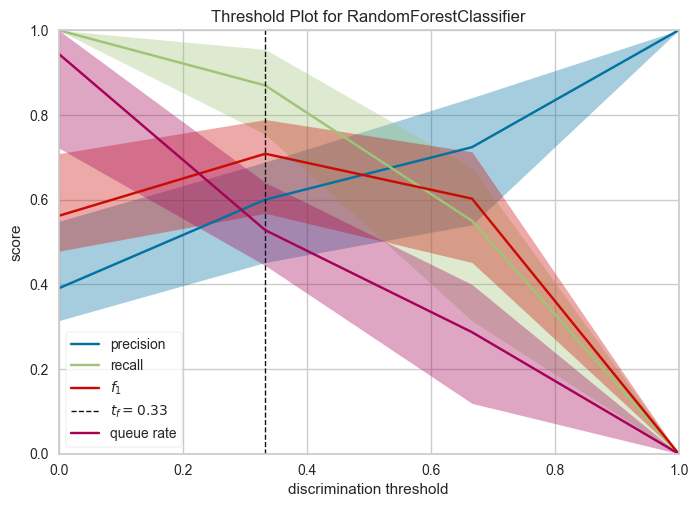

In [39]:
plot_model(best_models[1], 'threshold')

If you want to change this threshold (f.ex., if false positives are worse than false negatives in your specific case), then you can use the method `optimize_threshold`.

## Feature importance

Which features does the model lean on the most?

In [40]:
best_models

[XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
               colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.7,
               early_stopping_rounds=None, enable_categorical=False,
               eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
               grow_policy='depthwise', importance_type=None,
               interaction_constraints='', learning_rate=1e-06, max_bin=256,
               max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
               max_depth=10, max_leaves=0, min_child_weight=1, missing=nan,
               monotone_constraints='()', n_estimators=40, n_jobs=-1,
               num_parallel_tree=1, objective='binary:logistic',
               predictor='auto', ...),
 RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight='balanced',
                        criterion='entropy', max_depth=3, max_features=1.0,
                        max_leaf_nodes=None, max_samples=None,
                        min_im

In [41]:
print(best_models[0])

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.7,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=1e-06, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=10, max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=40, n_jobs=-1,
              num_parallel_tree=1, objective='binary:logistic',
              predictor='auto', ...)


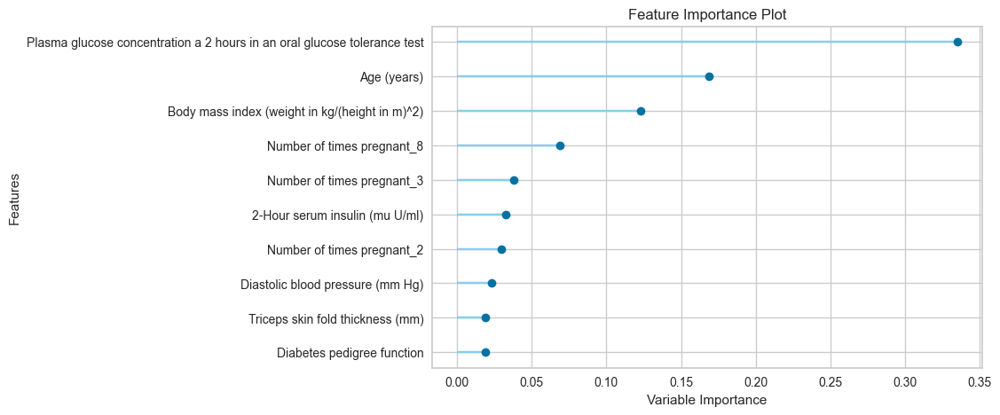

In [42]:
plot_model(best_models[0], 'feature')

In [43]:
print(best_models[1])

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight='balanced',
                       criterion='entropy', max_depth=3, max_features=1.0,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0002, min_impurity_split=None,
                       min_samples_leaf=6, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=260,
                       n_jobs=-1, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)


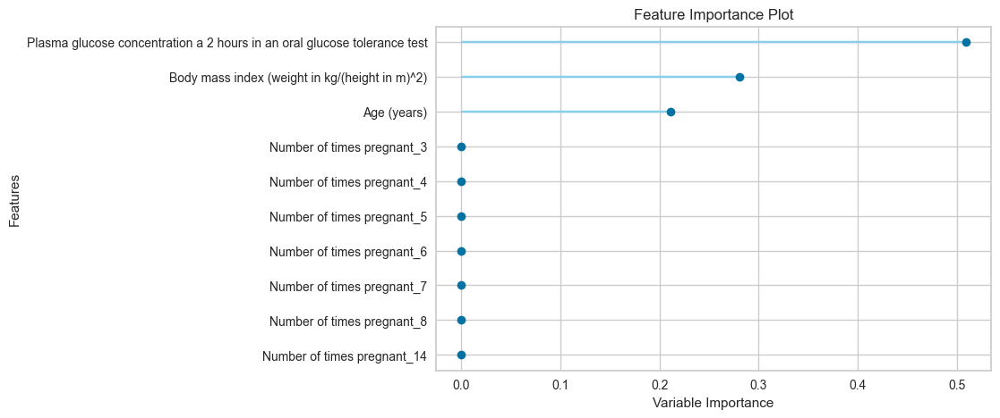

In [44]:
plot_model(best_models[1], 'feature')

In [45]:
print(best_models[2])

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.4, loss='deviance', max_depth=10,
                           max_features=1.0, max_leaf_nodes=None,
                           min_impurity_decrease=0.001, min_impurity_split=None,
                           min_samples_leaf=3, min_samples_split=7,
                           min_weight_fraction_leaf=0.0, n_estimators=230,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=42, subsample=0.75, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


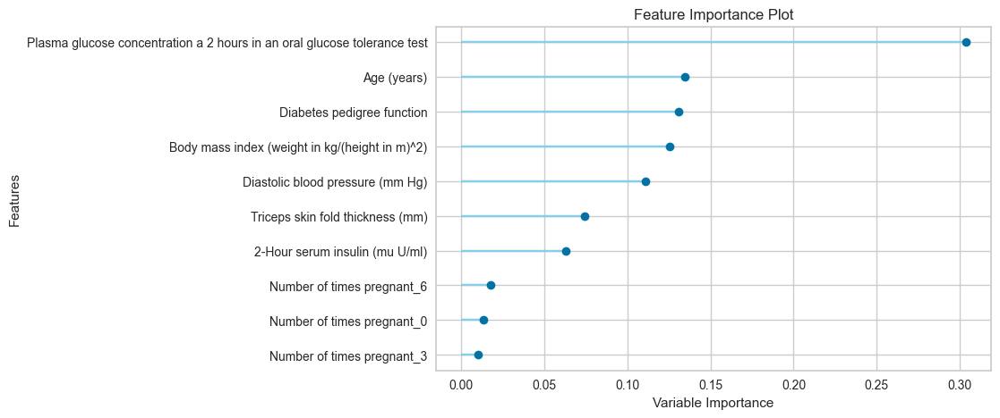

In [46]:
plot_model(best_models[2], 'feature')

### Model interpretation

We can dig a bit deeper into how the models work, for example, using [Shapley values](https://christophm.github.io/interpretable-ml-book/shapley.html). 

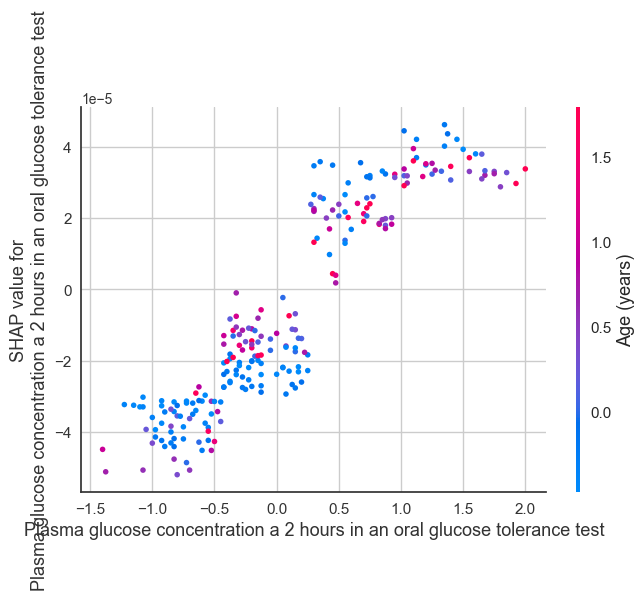

In [47]:
interpret_model(best_models[0], plot='correlation')

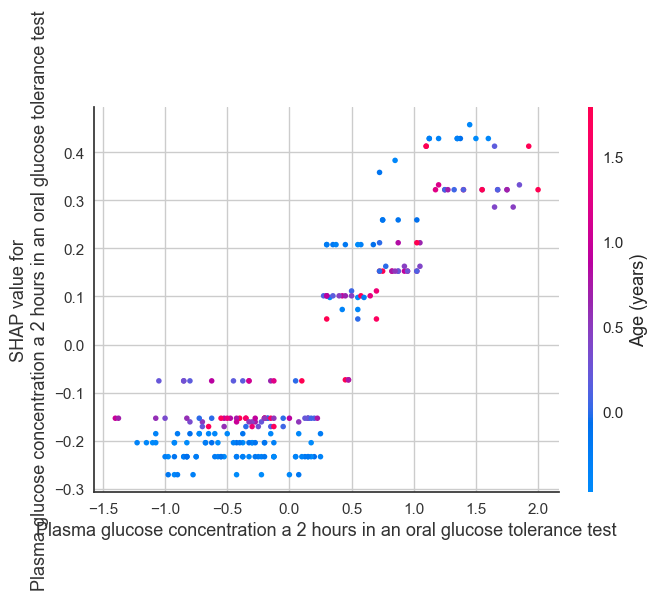

In [48]:
interpret_model(best_models[1], plot='correlation')

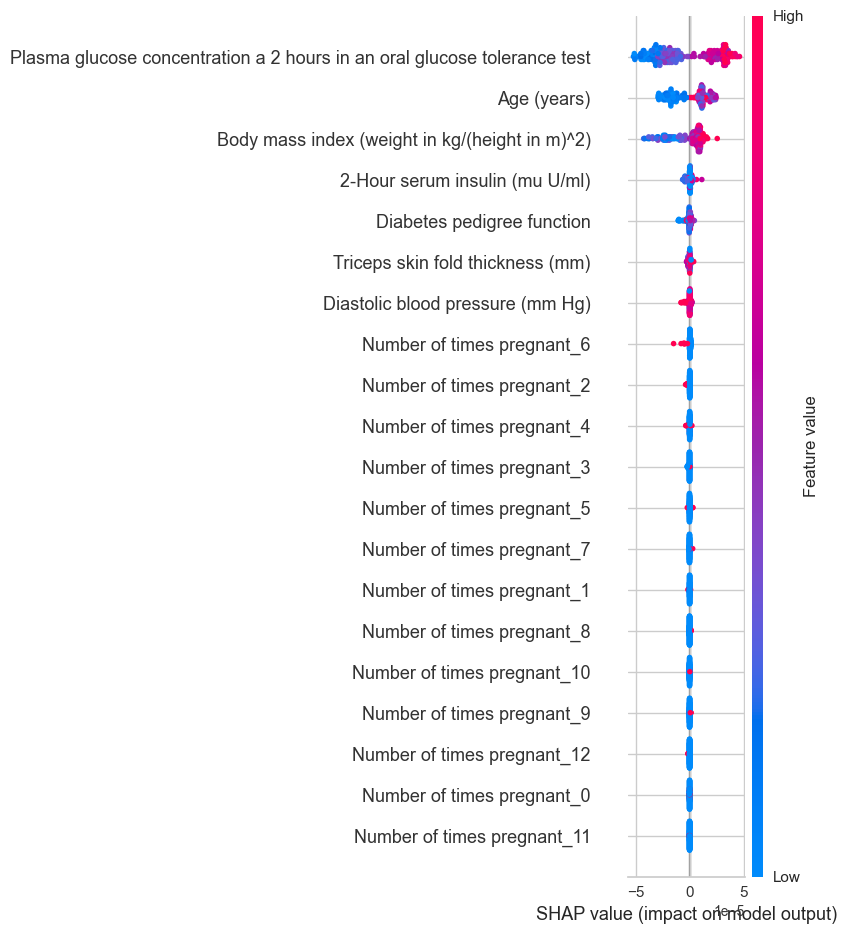

In [49]:
interpret_model(best_models[0])

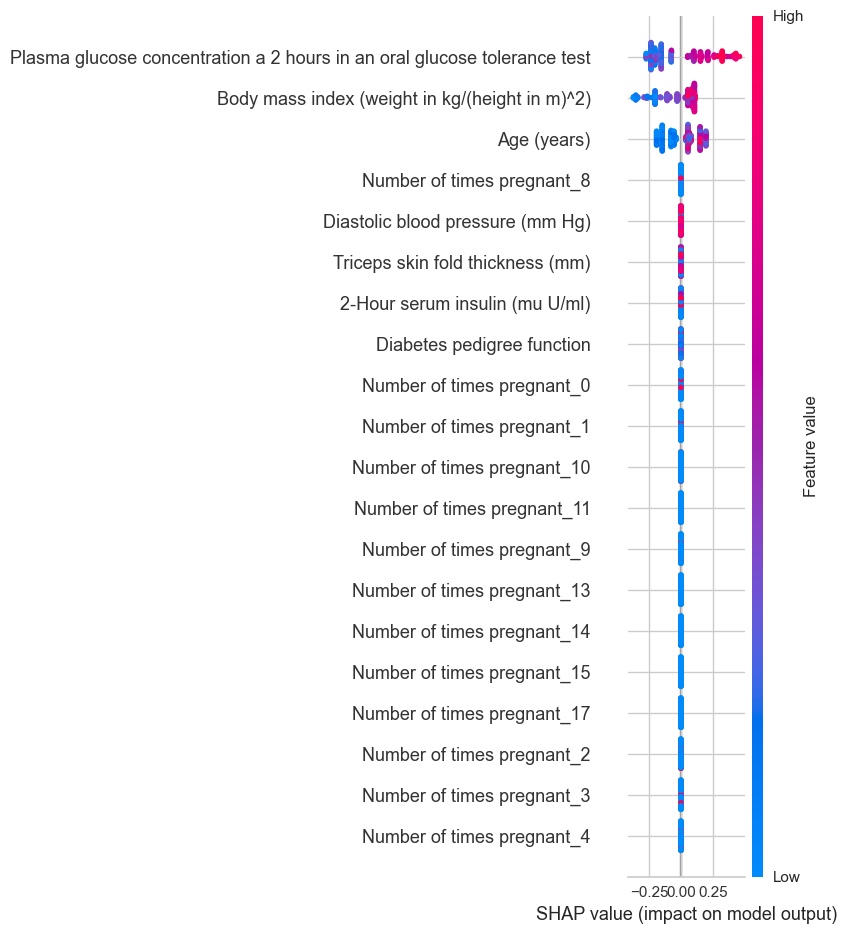

In [50]:
interpret_model(best_models[1])

# Use the model on new data

In [51]:
# Predict on the test data we put aside earlier
y_pred = predict_model(model)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Voting Classifier,0.7273,0.7385,0.7750,0.5794,0.6631,0.4419,0.4551


In [52]:
y_pred.head()

,Plasma glucose concentration a 2 hours in an oral glucose tolerance test,Diastolic blood pressure (mm Hg),Triceps skin fold thickness (mm),2-Hour serum insulin (mu U/ml),Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years),Number of times pregnant_0,Number of times pregnant_1,Number of times pregnant_10,...,Number of times pregnant_2,Number of times pregnant_3,Number of times pregnant_4,Number of times pregnant_5,Number of times pregnant_6,Number of times pregnant_7,Number of times pregnant_8,Number of times pregnant_9,Class variable,Label
0,-0.475,-0.8750,0.31250,1.193798,0.206186,0.150943,0.823529,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,1
1,-0.125,0.1875,0.28125,-0.279070,0.381443,-0.609164,-0.470588,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
2,-0.225,-0.5000,-0.71875,-0.279070,-0.123711,-0.582210,-0.470588,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
3,-0.250,0.5000,-0.71875,-0.279070,-0.762887,1.299191,0.294118,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0
4,0.475,1.1250,-0.71875,-0.279070,-0.216495,-0.442049,1.235294,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0


# Export the pipeline

When you are done constructing, training, evaluating, and interpreting the models, it's time to deploy them. First, you'll want to export the model together with the entire pipeline for pre-processing to, for example, the hard drive, to memory, or to or cloud provider.

When you start making predictions on entirely new data (in other words, after you've completed the first stage of the model building), then you can use `predict_model` on this data. The data will then be preprocessed according to the pipeline and passed through the model.

Remark: until now, we've put aside some data for testing. If you're done constructing the model, there's no point in not using this (often valuable) labeled data for training. One would like to train the model on _all_ the available labeled data. 

This can be achieved by using `finalize_model`:

In [53]:
final_model = finalize_model(model)

Then we can save the model:

In [54]:
save_model(final_model,'saved_model')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[],
                                       target='Class variable',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeri...
                                                                           min_impurity_decrease=0.001,
                                                                           min_impurity_split=None,
                              

# Deploy

PyCaret has built-in functionality for deployment to AWS, GCP, and Azure: https://pycaret.gitbook.io/docs/get-started/functions/deploy. But you're, of course, free to deploy anywhere else. 

In [55]:
#?deploy_model

## Make a simple "proof of concept" application using Gradio

In [56]:
create_app(final_model)

Running on local URL:  http://127.0.0.1:7860

To create a public link, set `share=True` in `launch()`.


(<gradio.routes.App at 0x7fdc47b4a550>, 'http://127.0.0.1:7860/', None)

In [58]:
data.head()

,Number of times pregnant,Plasma glucose concentration a 2 hours in an oral glucose tolerance test,Diastolic blood pressure (mm Hg),Triceps skin fold thickness (mm),2-Hour serum insulin (mu U/ml),Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years),Class variable
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will b

/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/pycaret/internal/pipeline.py", line 118, in fit
    result = super().fit(X, y=y, **fit_kwargs)
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/catboost/core.py", line 5128, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None,

[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will b

/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/pycaret/internal/pipeline.py", line 118, in fit
    result = super().fit(X, y=y, **fit_kwargs)
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/catboost/core.py", line 5128, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None,

[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will b

/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/pycaret/internal/pipeline.py", line 118, in fit
    result = super().fit(X, y=y, **fit_kwargs)
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/catboost/core.py", line 5128, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None,

[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will b

/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/pycaret/internal/pipeline.py", line 118, in fit
    result = super().fit(X, y=y, **fit_kwargs)
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/opt/anaconda3/envs/dat158-pycaret/lib/python3.8/site-packages/catboost/core.py", line 5128, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None,